# Tarea 2 : Accidentes del tránsito en la ciudad de Santiago.

## Aspectos generales.

- Fecha de entrega: 15 de octubre 2020, 23:59.

- Formato de entrega: carpeta comprimida (.zip) incluyendo Jupyter Notebook con el desarrollo (puede utilizar este mismo notebook), y las capas o archivos vectoriales que haya generado como parte de su análisis. El objetivo es que el Notebook pueda correr completamente dentro de la carpeta entregada. En el Notebook, incluya texto explicando los pasos u operaciones desarrolladas, no sólo el código.

- Vía de entrega: a través de Canvas, correo electrónico con archivo adjunto o link para descarga (enviar a la profesora cc. al ayudante del curso).

- La Tarea debe ser desarrollada en lenguaje de programación Python. Com parte de su trabajo, puede utilizar QGIS según le acomode para visualizar capas o realizar alguna operación espacial, pero para efectos de la entrega todo debe estar desarrollado en Python.

- Se sugiere hacer consultas y comentarios sobre la Tarea a traves del Foro del curso creado en Google Groups.


Como en toda gran ciudad capital, uno de los principales problemas de Santiago es la alta congestión vehicular, y el riesgo de choques y accidentes que ésta conlleva. En este ejercicio, analizaremos la distribución de choques en la ciudad de Santiago, con el objetivo de identificar y comunicar visualmente cuáles son las zonas y calles con mayor incidencia de choques.

En Chile, la Comisión Nacional de Seguridad del Tránsito (CONASET) publica anualmente bases de datos geocodificadas de los siniestros de tránsito registrados en las comunas del área del Gran Santiago en la Región Metropolitana de Santiago. Estas capas contienen detalles de fecha, hora, tipo de accidente, causa basal del accidente, dirección donde ocurrió el accidente, cantidad de personas fallecidas y lesionadas según gravedad, entre otros. 
Dependiendo de si un accidente causa algún fallecimiento, lesiones graves, menos graves o leves, podemos definir un índice de severidad de cada evento de acuerdo a la siguiente tabla:

|Tipo de víctimas | Índice de severidad|
|---|---|
|Fallecidos | 5|
| Graves | 4 |
| Menos graves | 3 |
| Leves | 2 |
| Sin lesionados | 1|

Esta definición aplica a cada siniestro en particular. Para una determinada zona o calle, su índice de severidad anual estará dada por la **sumatoria de los índices de todos los siniestros ocurridos en ella durante un año**. Es decir, el índice de severidad de la calle o zona $j$ está dada por:

$$I_{sev}^{j}=\sum_{i=1}^n I_{sev}^i$$

donde $I_{sev}^i$ es el índice de severidad de cada uno de los $i=1,...n$ accidentes ocurridos en la calle o zona $j$.


## Datos del problema.

Para el análisis de la distribución de accidentes del tránsito y el índice de severidad de accidentes por zona y calle, se utilizarán los conjuntos de datos descritos a continuación. Todos ellos pueden ser descargados desde el siguiente link (~100 Mb):

https://drive.google.com/file/d/1MXOrKXiA2AiKF7hiKxJ1B-5KVm8O1s8E/view?usp=sharing

#### 1. Área urbana general de Santiago: `data/BCN/areas_urbanas.shp`

La Biblioteca del Congreso Nacional (BCN) publica en su Mapoteca una capa con las áreas urbanas de todo Chile. A partir de esta capa, puede obtener el límite del área urbana general del Gran Santiago. 

#### 2. Siniestros de tránsito, Gran Santiago, RM, Chile, 2018: `data/CONASET/SiniestrosRM2018-shp/02f24240-075a-4d66-8887-829a50916264202045-1-15wyzk0.d1e1.shp`

Esta capa contiene la geocodificación de los siniestros de tránsito registrados en las comunas del área del Gran Santiago en la Región Metropolitana de Santiago durante el año 2018. Contiene detalles de fecha, hora, tipo de accidente, causa basal del accidente, dirección donde ocurrió el accidente, cantidad de personas fallecidas y lesionadas según gravedad, entre otros. 
Esta base de datos contiene algunos accidentes que no están georreferenciados, los cuales pueden ser eliminados del análisis.

#### 3. Calles de Santiago: `data/OSM/gis_osm_roads_free_1.shp`

OpenStreetMap(OSM) es un proyecto colaborativo para crear un mapa libre y editable del mundo, construido por una comunidad de cartógrafos que contribuyen y mantienen data sobre calles, cafés, estaciones de trenes, y mucho más. Más que el mapa, el principal producto del poryecto es la data generada.

El sitio GeoFabrik pubblica extractos de data de OSM que se actualizan constantemente. Este servicio de descarga de datos abiertos es ofrecido en forma gratuita por Geofabrik GmbH. La capa descargada corresponde a la información de calles de todo Chile, por lo que ud. deberá extraer sólo aquellas calles ubicadas en el Gran Santiago (polígono definido en la capa 1). Además, incluye vías peatonales, ciclovías, calles de servicio, y otras vías menores. Dado que analizaremos accidentes vehiculares, sólo nos interesará la ubicación de las vías clasificadas como: `tertiary, tertiary_link, secondary, secondary_link, primary, primary_link, motorway, motorway_link`. Las demás clasificaciones pueden ser descartadas para efectos de este análisis.

#### 4. Microzonificación urbana de Santiago: `data/BCN/Zonificacion_EOD2012/Zonificacion_EOD2012.shp`

Para analizar la distribución de accidentes en el Gran Santiago, necesitamos dividir la ciudad en zonas o polígonos más pequeños. En este caso, usaremos las microzonas urbanas definidas en la última Encuesta Origen-Destino (EOD), publicada por la Secretaría de Transportes (SECTRA). Esta zonificación considera zonas fuera de área urbana general de Santiago definida en la capa 1, por lo que será necesario seleccionar sólo los polígonos contenidos dentro de dicho límite urbano. 



## Desarrollo.

El objetivo de este ejercicio es generar **dos mapas** que permitan responder visualmente las siguientes preguntas:

1. ¿En qúe zona de Santiago se registra el número total de accidentes?
2. ¿Qué calles de Santiago tienen en mayor índice de severidad de accidentes?

Al menos uno de los dos mapas a generar debe ser un mapa interactivo en formato `.html`. Para ello puede usar la librería de su preferencia.

El diseño y configuración de cada mapa será definido por cada autor, pero deben incluirse como elementos básicos:
- Geometrías de la ciudad de Santiago, zonas y calles según correpsponda.
- Mapas de colores para representar el número total de accidentes por zona o índice de severidad de accidentes por calles.
- Leyenda o escala de colores del mapa.
- Título del mapa.

Para generar estos mapas, será necesario desarrollar algunos pasos previos, como por ejemplo:
- Seleccionar información correspondiente al Gran Santiago.
- Asignar índices de severidad a cada accidente,de acuerdo a los criterios definidos en la Tabla anterior.
- Asociar cada accidente a una determinada zona y calle. Se considerará que un accidente ocurre en una determinada vía si está ubicado dentro de una distancia (buffer) de **5 metros** de ella.
- Reproyectar datos cuando sea necesario.
- Calcular el número total de accidentes dentro de cada zona de Santiago.
- Calcular el índice de severidad total de accidentes para cada vía de Santiago.


A continuación de muestran como referencia ejemplos de los mapas a desarrollar:

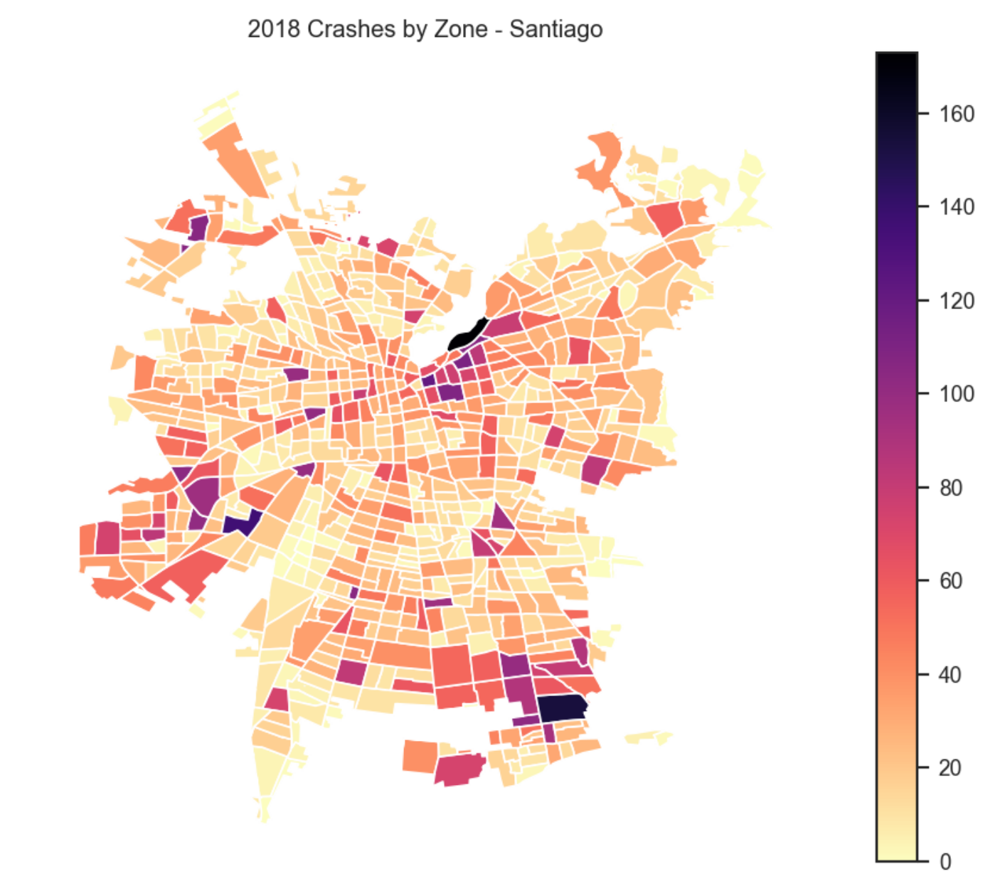

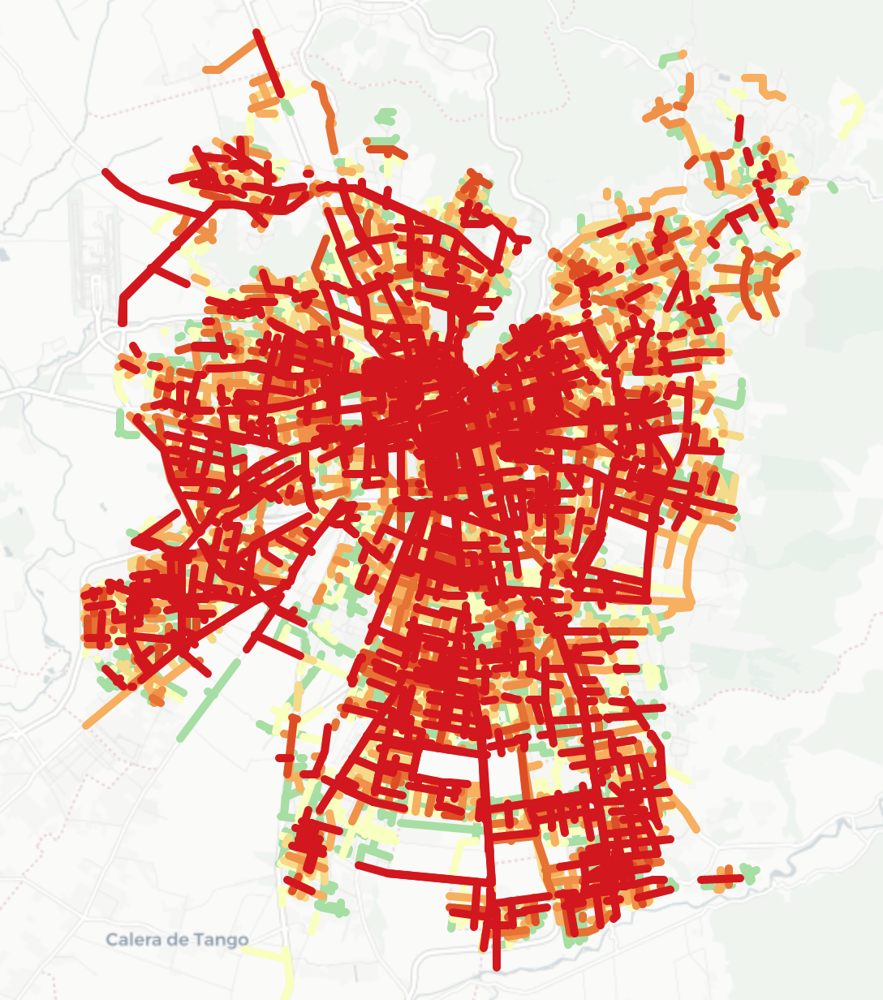



In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import folium
from shapely.geometry import Polygon, Point

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:84: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  warnings.warn(


In [2]:
# Cargamos datos
areas_urbanas = gpd.read_file("data/BCN/areas_urbanas/areas_urbanas.shp").to_crs(crs = 'EPSG:5361')
siniestros = gpd.read_file("data/CONASET/SiniestrosRM2018-shp/siniestros.shp").to_crs(crs = 'EPSG:5361')
calles = gpd.read_file("data/OSM_Chile/gis_osm_roads_free_1.shp").to_crs(crs = 'EPSG:5361')
microzonas = gpd.read_file("data/Zonificacion_EOD2012/Zonificacion_EOD2012.shp").to_crs(crs = 'EPSG:5361')

In [3]:
# Creamos columna de índices para las tablas 

siniestros = siniestros.reset_index()
calles = calles.reset_index()
microzonas = microzonas.reset_index()

In [4]:
# Obtenemos la zona correspondiente al Gran Stgo

stgo = areas_urbanas[areas_urbanas['NOMBRE'] == 'Santiago']

In [5]:
# Cruzamos microzonas con stgo

microzonas = gpd.overlay(microzonas, stgo[['NOMBRE', 'geometry']], how='intersection')

In [6]:
# Cruzamos calles con Stgo (Se demora varios minutos)

calles =  gpd.overlay(calles, stgo[['NOMBRE', 'geometry']], how = 'intersection')

In [7]:
# Asignamos índice de gravedad partiendo de menor gravedad hacia arriba

siniestros['Severidad'] = 1
siniestros.loc[siniestros.Leves > 0, 'Severidad'] = 2
siniestros.loc[siniestros.Menos_Grav > 0, 'Severidad'] = 3
siniestros.loc[siniestros.Graves > 0, 'Severidad'] = 4
siniestros.loc[siniestros.Fallecidos > 0, 'Severidad'] = 5

In [8]:
# Cambiamos de nombre las columnas de índices

siniestros.rename(columns = {'index': 'id_siniestro'}, inplace = True)
calles.rename(columns = {'index': 'id_calle'}, inplace = True)
microzonas.rename(columns = {'index': 'id_microzona'}, inplace = True)

In [9]:
# Asociamos Siniestros a microzonas

siniestros = gpd.overlay(siniestros, microzonas[['id_microzona', 'geometry']], how='intersection')

In [10]:
# Creamos función para contar siniestros por microzona

def n_siniestros(microzona, sin):
    n_siniestros = sin[sin['id_microzona'] == microzona].shape[0]
    return pd.Series({'n_siniestros': n_siniestros})

In [11]:
df = microzonas.id_microzona.apply(n_siniestros, sin = siniestros)
microzonas['n_siniestros'] = df['n_siniestros']

In [12]:
# Consideramos columnas de nuestro interés para las calles y las almacenamos en la variable vias

vias = calles[['id_calle', 'name', 'geometry']].copy()

In [13]:
# Obtenemos la tabla auxiliar de siniestros definidas por la geometría dada por el buffer con radio de 5 metros

buffer_siniestros = siniestros[['id_siniestro', 'Severidad', 'geometry']].copy()
buffer_siniestros['geometry'] = gpd.GeoSeries(buffer_siniestros['geometry'].buffer(distance = 5), crs = 'EPSG:5361')

In [14]:
# Obtenemos tabla de intersección vías con buffer siniestros

df = gpd.overlay(vias, buffer_siniestros, how = 'intersection')

In [15]:
# Definimos función para obtener índice severidad de la vía

def severidad(via, df):
    siniestros_en_via = df.loc[df['id_calle'] == via]
    severidad = siniestros_en_via['Severidad'].sum()
    return pd.Series({'Severidad': severidad})

In [16]:
# Obetenemos índice de severidad para cada vía y lo almacenamos en la columna "Severidad"

vias['Severidad'] = vias.id_calle.apply(severidad, df = df)['Severidad']

## Estamos en condiciones ahora de generar los gráficos

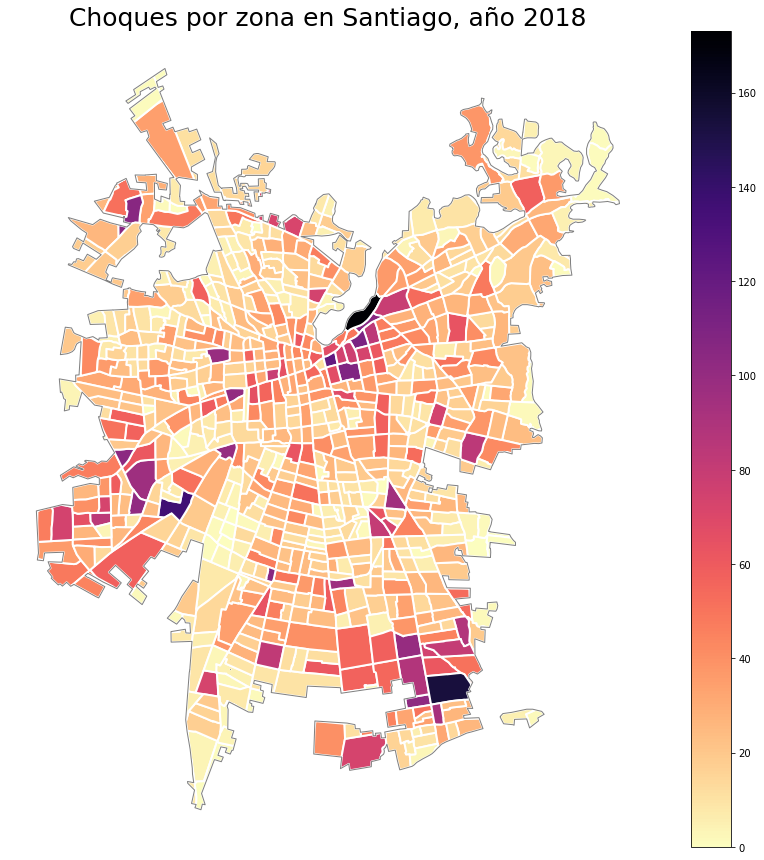

In [17]:
variable = 'n_siniestros'

fig, ax = plt.subplots(1, figsize=(15, 15))
microzonas.plot(ax=ax, column=variable, cmap='magma_r', k= 15, edgecolor='w', lw = 2 ,legend = True)
stgo.plot(ax = ax, color = 'None', edgecolor = 'gray', lw = 1)
#entidades_rurales.plot(ax = ax, color = 'None', edgecolor='gray')
ax.set_title('Choques por zona en Santiago, año 2018', fontdict={'fontsize': 25, 'fontweight' :  30, 'color': 'black'})
ax.axis('off')
plt.show()

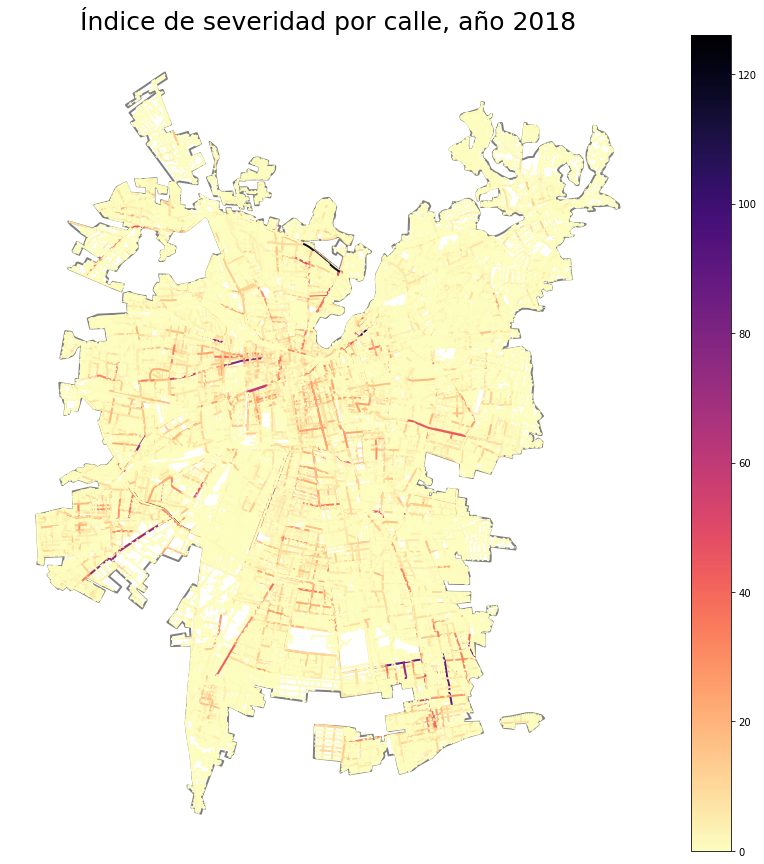

In [18]:
variable = 'Severidad'

fig, ax = plt.subplots(1, figsize=(15, 15))
vias.plot(ax=ax, column=variable, cmap='magma_r', k=8, lw = 2 ,legend = True)
stgo.plot(ax = ax, color = 'None', edgecolor = 'gray', lw = 2)
ax.set_title('Índice de severidad por calle, año 2018', fontdict={'fontsize': 25, 'fontweight' :  30, 'color': 'black'})
ax.axis('off')
plt.show()

### Para efectuar el mapa interactivo primero hacemos un análisis para las vías

In [19]:
vias.describe()

,id_calle,Severidad
count,88769.000000,88769.000000
mean,233532.131465,0.649022
std,156564.041232,3.281925
min,0.000000,0.000000
25%,53686.000000,0.000000
50%,233137.000000,0.000000
75%,380271.000000,0.000000
max,545569.000000,126.000000


La gran mayoría de los datos posee índice de severidad igual a cero por lo que nos quedaremos con los datos restantes para trabajar.

In [20]:
vias_restantes = vias[vias['Severidad'] > 0].sort_values(by='Severidad')
vias_restantes.describe()

,id_calle,Severidad
count,9808.000000,9808.000000
mean,207836.917618,5.874082
std,151089.479763,8.173026
min,1.000000,1.000000
25%,45947.750000,1.000000
50%,220741.500000,3.000000
75%,314620.250000,7.000000
max,545569.000000,126.000000


### Definiremos nuestra propia escala de rojos a partir de saltos de 20 en el índice de severidad

In [21]:
# Definimos diccionario de grupos

g = {}

g[1] = vias_restantes[vias_restantes['Severidad'] <= 20].copy()
g[2] = vias_restantes[(vias_restantes['Severidad'] > 20) & (vias_restantes['Severidad'] <= 40)].copy()
g[3] = vias_restantes[(vias_restantes['Severidad'] > 40) & (vias_restantes['Severidad'] <= 60)].copy()
g[4] = vias_restantes[(vias_restantes['Severidad'] > 60) & (vias_restantes['Severidad'] <= 80)].copy()
g[5] = vias_restantes[(vias_restantes['Severidad'] > 80) & (vias_restantes['Severidad'] <= 100)].copy()
g[6] = vias_restantes[vias_restantes['Severidad'] > 100].copy()

In [22]:
# Definimos diccionario de colores

c = {}
c[1] = '#FFDAB9'
c[2] = '#FA8072'
c[3] = '#E9967A'
c[4] = '#F08080'
c[5] = '#CD5C5C'
c[6] = '#DC143C'


In [23]:
# Creamos mapa

lat, lon = (-33.447487, -70.673676) # Santiago coordenadas

m = folium.Map(location=[lat, lon],
               tiles="cartodbpositron",
               zoom_start=11)


In [24]:
for i in range(1, len(g) + 1):
    folium.Choropleth(g[i], line_weight = 3, line_color = c[i]).add_to(m)

In [25]:
m

In [26]:
# Guardamos el mapa

m.save('mapa.html')